In [1]:
from osgeo import gdal, gdal_array
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import pandas as pd
import cv2
import sys

In [2]:
# folder path or file path constants that will be used in this project

# Root Directory
D_DIR = "D:"
F_DIR = "F:"


# Folder inside D:\\wildfire-sumatera-dataset
WILDFIRE_SUMATERA_DATASET_FOLDER_PATH = f"{D_DIR}\\wildfire-sumatera-dataset"


# Folders and metadatas inside D:\\wildfire-sumatera-dataset
WILDFIRE_SUMATERA_GEOTIFF_FOLDER_PATH        = f"{WILDFIRE_SUMATERA_DATASET_FOLDER_PATH}\\wildfire-sumatera-geotiff"
WILDFIRE_SUMATERA_JPEG_FOLDER_PATH           = f"{WILDFIRE_SUMATERA_DATASET_FOLDER_PATH}\\wildfire-sumatera-jpeg"
# Files (.csv) and metadatas inside D:\\wildfire-sumatera-dataset
METADATA_LANDSAT_8_FILE_PATH  = f"{WILDFIRE_SUMATERA_DATASET_FOLDER_PATH}\\metadata_landsat_8.csv"
METADATA_SENTINEL_2_FILE_PATH = f"{WILDFIRE_SUMATERA_DATASET_FOLDER_PATH}\\metadata_sentinel_2.csv"



# Folders inside D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff
SENTINEL_2_GEOTIFF_FOLDER_PATH = f"{WILDFIRE_SUMATERA_GEOTIFF_FOLDER_PATH}\\sentinel-2"
LANDSAT_8_GEOTIFF_FOLDER_PATH  = f"{WILDFIRE_SUMATERA_GEOTIFF_FOLDER_PATH}\\landsat-8"


# Folders inside D:\\wildfire-sumatera-dataset\\wildfire-sumatera-jpeg
SENTINEL_2_JPEG_FOLDER_PATH = f"{WILDFIRE_SUMATERA_JPEG_FOLDER_PATH}\\sentinel-2"
LANDSAT_8_JPEG_FOLDER_PATH  = f"{WILDFIRE_SUMATERA_JPEG_FOLDER_PATH}\\landsat-8"



# Folders inside D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8
LANDSAT_8_PREFIRE_GEOTIFF_FOLDER_PATH  = f"{LANDSAT_8_GEOTIFF_FOLDER_PATH}\\prefire"
LANDSAT_8_POSTFIRE_GEOTIFF_FOLDER_PATH = f"{LANDSAT_8_GEOTIFF_FOLDER_PATH}\\postfire"

# Folders inside D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2
SENTINEL_2_PREFIRE_GEOTIFF_FOLDER_PATH  = f"{SENTINEL_2_GEOTIFF_FOLDER_PATH}\\prefire"
SENTINEL_2_POSTFIRE_GEOTIFF_FOLDER_PATH = f"{SENTINEL_2_GEOTIFF_FOLDER_PATH}\\postfire"

dirs = [
    WILDFIRE_SUMATERA_DATASET_FOLDER_PATH,
    WILDFIRE_SUMATERA_GEOTIFF_FOLDER_PATH, 
    WILDFIRE_SUMATERA_JPEG_FOLDER_PATH,
    
    SENTINEL_2_GEOTIFF_FOLDER_PATH, 
    LANDSAT_8_GEOTIFF_FOLDER_PATH,
    SENTINEL_2_JPEG_FOLDER_PATH,
    LANDSAT_8_JPEG_FOLDER_PATH,
    
    LANDSAT_8_PREFIRE_GEOTIFF_FOLDER_PATH,
    LANDSAT_8_POSTFIRE_GEOTIFF_FOLDER_PATH,
    SENTINEL_2_PREFIRE_GEOTIFF_FOLDER_PATH,
    SENTINEL_2_POSTFIRE_GEOTIFF_FOLDER_PATH,
]

for dir_ in dirs:
    if not os.path.exists(dir_):
        os.mkdir(dir_)
        print(f"{dir_} has been created")
    else:
        print(f"{dir_} already exist")

D:\wildfire-sumatera-dataset already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2 already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8 already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2 already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8 already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\prefire already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\prefire already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire already exist


# 1. Creating Functions
This steps involve creating function that will be frequently used throughout the notebook.

In [3]:
def display_image(img, figsize=(15, 10), title="", cmap=None):
    """
    :param img: array of pixels from one satellite band
    :param figsize: determine the size of the figure
    :param title: title of the figure
    :param cmap: color for the images
    :return: None (just plot figure of the band)
    """
    plt.figure(figsize=figsize)
    plt.title(title)
    plt.imshow(img, cmap=cmap)
    plt.show()

In [4]:
def get_img_as_array(filepath, dictionary):
    """
    :param filepath: location of the satellite bands
    :param dictionary: information about the image bands
    :return: dictionary containing name of the satellite bands as key and array of pixels as value  
    """
    os.chdir(filepath)
    print(filepath)
    band_imgs = {}
    for key, val in dictionary.items():
        # open the .tiff file
        if os.path.exists(filepath):
            tiff_file = gdal.Open(key)
            bands = key.split('_')
            for i, band in enumerate(bands):
                band_imgs[band] = tiff_file.GetRasterBand(i+1).ReadAsArray()
    
    return band_imgs

In [5]:
def convert_to_jpeg(bands=[], file_path=""):
    """
    :param bands: array of satellite image bands
    :param filepath: location of the image being stored
    :return: return result of the conversion (True which is 'success' or False which is 'failed') 
    """
    if not bands:
        print("bands cannot be empty")
        return False 
    
    if not file_path:
        print("filename cannot be empty")
        return False
    img = cv2.merge(bands)
    cv2.imwrite(file_path, img*256)
    return True

In [6]:
# constants
FACTOR = 2
LANDSAT_POSTFIRE_DICT= {
    'dnbr_b7': 2,
    'b5_b4': 2,
    'b3_b2': 2
}

SENTINEL_POSTFIRE_DICT = {
    'dnbr_b12': 2,
    'b8_b4': 2,
    'b3_b2': 2
}


# 2. Creating Dataframe (Metadata) for Landsat Images
Include:
1. folder_paths = use to store all folder paths
2. class = use to determine the label of the image
3. mean_dnbr = stores mean of pixels in delta normalized burned ratio. 
4. median_dnbr = stores median of pixels in delta normalized burned ratio.

In [19]:
# getting list of folder paths
landsat_dictionary = {
    'folder_paths_geotiff' : [],
    'mean_dnbr' : [],
    'median_dnbr' : [],
}
landsat_dictionary['folder_paths_geotiff'] = os.listdir(LANDSAT_8_POSTFIRE_GEOTIFF_FOLDER_PATH)
# sort using key = int to convert data to int first before sorting
landsat_dictionary['folder_paths_geotiff'].sort(key=int)

# adding a folder path of its parent 
landsat_dictionary['folder_paths_geotiff'] = [LANDSAT_8_POSTFIRE_GEOTIFF_FOLDER_PATH + "\\" + folder_name 
                                      for folder_name in landsat_dictionary['folder_paths_geotiff']] 
landsat_dictionary

{'folder_paths_geotiff': ['D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\0',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\1',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\2',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\3',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\4',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\5',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\6',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\7',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\8',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\9',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\10',
  'D:\\wildfire-sumatera-data

In [ ]:
# getting statistics median, mean
landsat_dictionary['mean_dnbr'] = []
landsat_dictionary['median_dnbr'] = []

for folder in landsat_dictionary['folder_paths_geotiff']:
    img_band = get_img_as_array(folder, LANDSAT_POSTFIRE_DICT)
    
    # find mean of dnbr only value above 0
    try:
        temp = img_band['dnbr']
        temp = np.where(temp>0, temp, np.nan)
        landsat_dictionary['mean_dnbr'].append(np.nanmean(temp))
        landsat_dictionary['median_dnbr'].append(np.nanmedian(temp))
        print(len(landsat_dictionary['mean_dnbr']))
        print(len(landsat_dictionary['median_dnbr']))
    except:
        landsat_dictionary['mean_dnbr'].append(np.nan)
        landsat_dictionary['median_dnbr'].append(np.nan)
        print("there's some error occured")

D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\0
1
1
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\1
2
2
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\2
3
3
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\3
4
4
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\4
5
5
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\5
6
6
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\6
7
7
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\7
8
8
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\8
9
9
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\9
10
10
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\10
11
11
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\11
12
12
D:\wildfire-sumatera-dataset\wil

101
100
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\100
102
101
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\101
103
102
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\102
104
103
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\103
105
104
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\104
106
105
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\105
107
106
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\106
108
107
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\107
109
108
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\108
110
109
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\109
111
110
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\110
112
111
D:\wildfire-sumatera-dataset\wildfire-sumatera

## Export to .csv
Export to .csv immediately because the time it took to compute mean and median nbr is quite long. 

In [104]:
# convert to pandas DataFrame and export as .csv file
# landsat_8_df = pd.DataFrame(landsat_dictionary)
# landsat_8_df.to_csv(dp.METADATA_LANDSAT_8_FILE_PATH, index=False)

# 3. Take a Look at Landsat Images

In [17]:
landsat_metadata = pd.read_csv(METADATA_LANDSAT_8_FILE_PATH)

## Landsat-8 Postfire Images

D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\5624


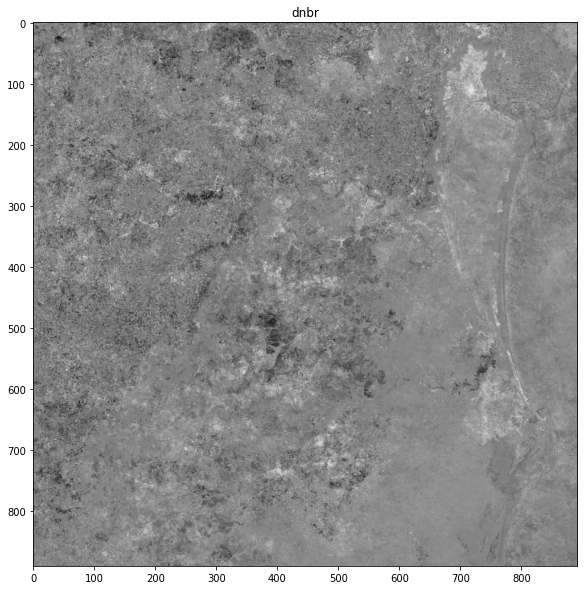

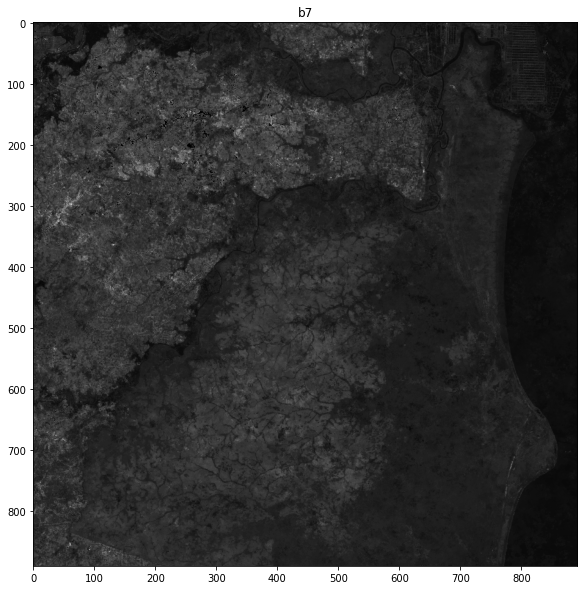

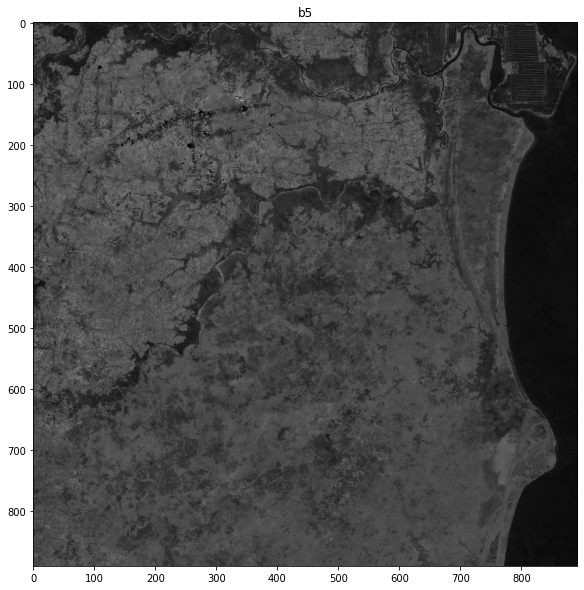

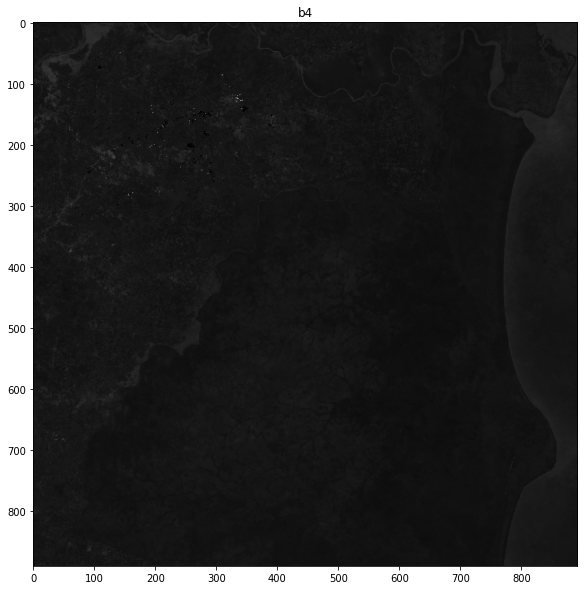

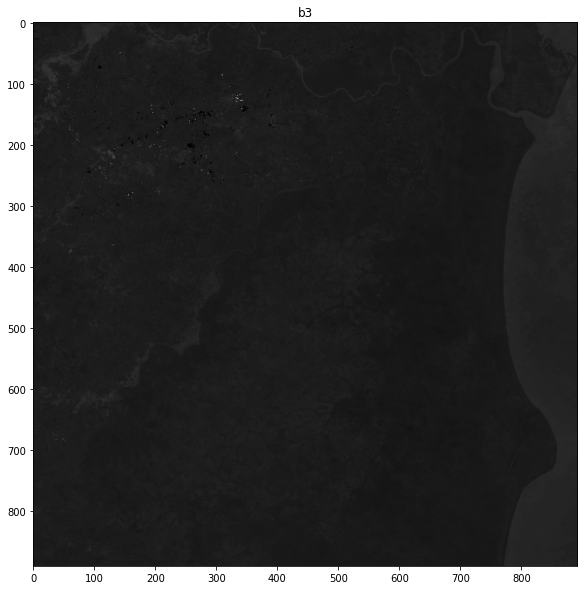

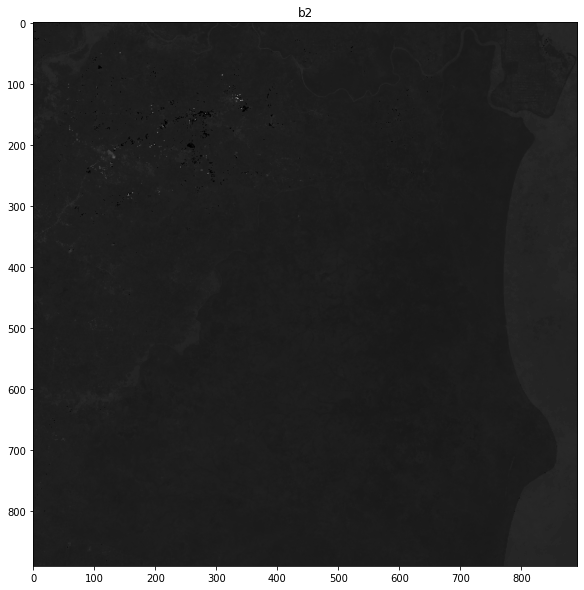

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


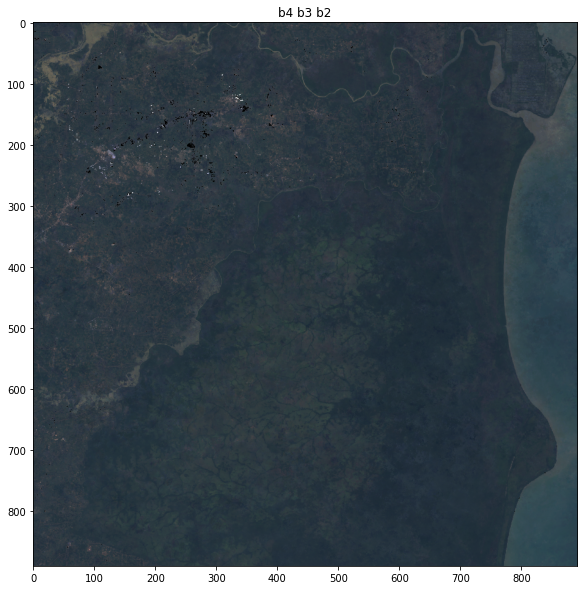

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


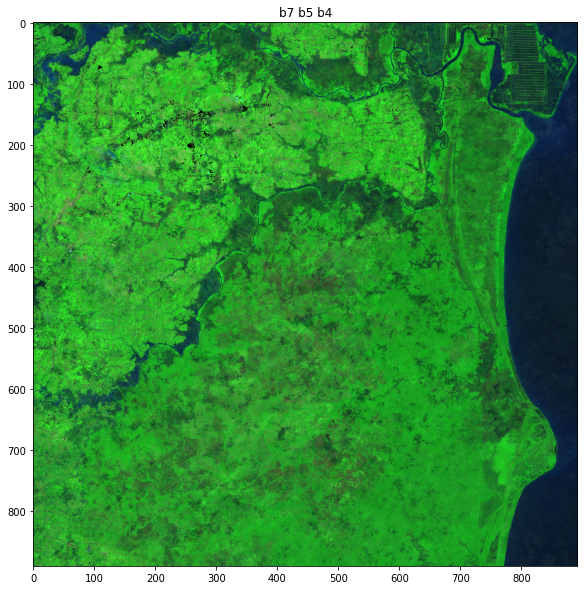

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


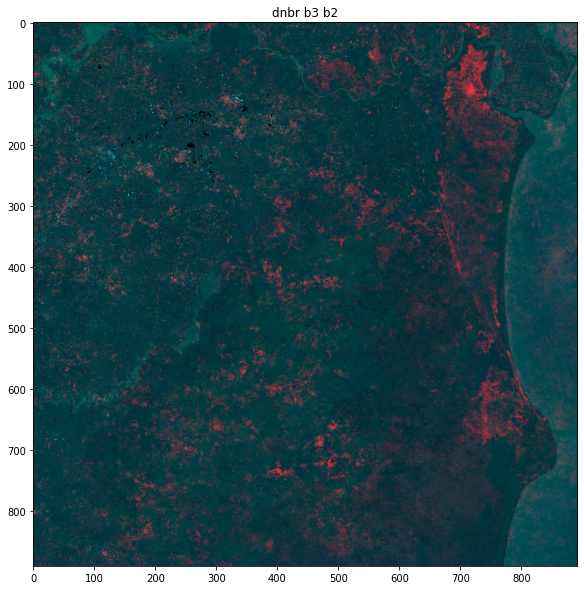

In [19]:
landsat_postfire_dict = {
    'dnbr_b7': 2,
    'b5_b4': 2,
    'b3_b2': 2
}
os.chdir(LANDSAT_8_POSTFIRE_GEOTIFF_FOLDER_PATH)
landsat_postfire_img_band = get_img_as_array(
    os.path.abspath(landsat_metadata['folder_paths_geotiff'][5624]), 
    LANDSAT_POSTFIRE_DICT,
)

for band, img in landsat_postfire_img_band.items():
    display_image(img, figsize=(100, 10), title=band, cmap="gray")

b4_b3_b2 = np.dstack(
    (
        landsat_postfire_img_band['b4'], 
        landsat_postfire_img_band['b3'], 
        landsat_postfire_img_band['b2'],
    )
)
b7_b5_b4 = np.dstack(
    (
        landsat_postfire_img_band['b7'], 
        landsat_postfire_img_band['b5'], 
        landsat_postfire_img_band['b4'],
    )
)

dnbr_b3_b2 = np.dstack(
    (
        landsat_postfire_img_band['dnbr'],
        landsat_postfire_img_band['b3'],
        landsat_postfire_img_band['b2'],
    )
)

display_image(b4_b3_b2*FACTOR, figsize=(100, 10), title="b4 b3 b2")
display_image(b7_b5_b4*FACTOR, figsize=(100, 10), title="b7 b5 b4")
display_image(dnbr_b3_b2*FACTOR, figsize=(100, 10), title="dnbr b3 b2")

## Plot Mean dNBR (Delta Normalized Burned Ratio) from Landsat-8 Metadata
Determine class of the image based on mean of Delta Normalized Burned Ration of each image

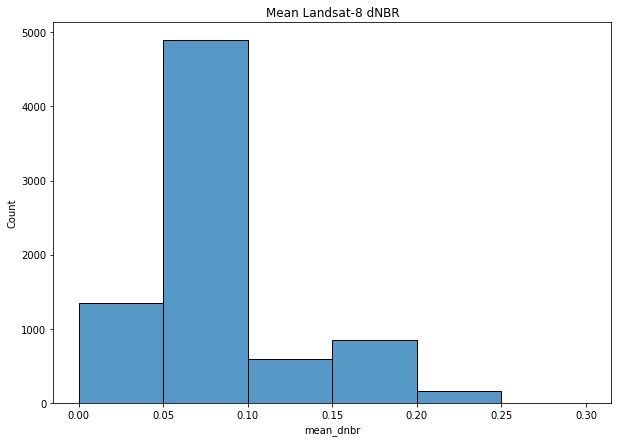

In [20]:
bins = [i for i in np.arange(0,0.35,0.05)]

plt.figure(figsize=(10,7))
plt.title("Mean Landsat-8 dNBR")
sns.histplot(landsat_metadata['mean_dnbr'], bins=bins)
plt.show()

Based on the histogram plot above, we will determine class as based on this terms:
1. if mean below <= 0.05 class 0
2. if mean below <= 0.1 class 1
3. if mean below 0.1 <  class 2

In [21]:
# if mean below <= 0.05 class 0
# if mean below <= 0.1 class 1
# if mean below 0.1 <  class 2
burn_severity_class = []

for mean_dnbr in landsat_metadata['mean_dnbr']:
    if mean_dnbr <= 0.05:
        burn_severity_class.append(0)
    elif mean_dnbr <= 0.1:
        burn_severity_class.append(1)
    else:
        burn_severity_class .append(2)

In [22]:
landsat_metadata['class'] = burn_severity_class
landsat_metadata.head()

,folder_paths_geotiff,mean_dnbr,median_dnbr,image_condition,file_paths_jpeg,class
0,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.050867,0.028118,1,D:\wildfire-sumatera-dataset\wildfire-sumatera...,1
1,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.050547,0.027762,1,D:\wildfire-sumatera-dataset\wildfire-sumatera...,1
2,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.054626,0.029420,1,D:\wildfire-sumatera-dataset\wildfire-sumatera...,1
3,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.027477,0.017275,1,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0
4,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.050742,0.028028,1,D:\wildfire-sumatera-dataset\wildfire-sumatera...,1


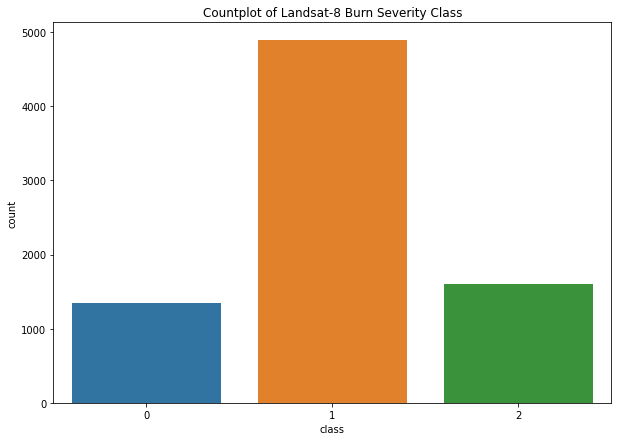

In [23]:
plt.figure(figsize=(10,7))
plt.title("Countplot of Landsat-8 Burn Severity Class")
sns.countplot(x='class', data=landsat_metadata)
plt.show()

## Export to .csv file

In [25]:
landsat_metadata.to_csv(METADATA_LANDSAT_8_FILE_PATH, index=False)

## Plot Median dNBR (Delta Normalized Burned Ratio) from Landsat-8 Metadata
Determine class of the image based on median of Delta Normalized Burned Ration of each image

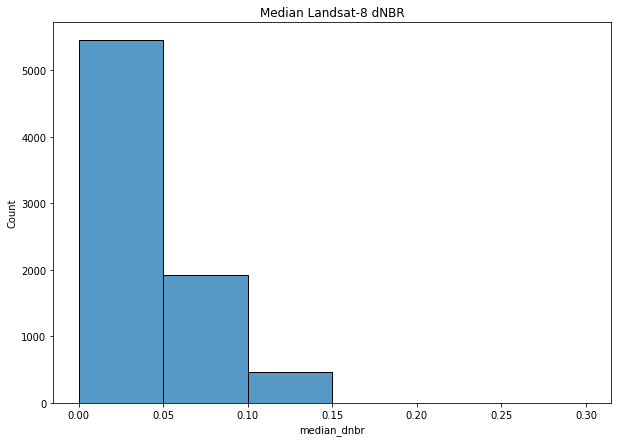

In [26]:
bins = [i for i in np.arange(0,0.35,0.05)]

plt.figure(figsize=(10,7))
plt.title("Median Landsat-8 dNBR")
sns.histplot(landsat_metadata['median_dnbr'], bins=bins)
plt.show()

## Convert to .jpeg file
The steps for this code involve:
1. Looping through all the GeoTIFF file paths from the **landsat_metadata** (D:\\wildfire-sumatera-dataset\\metadata_landsat_8.csv)
2. Create a new file name with its extension which is *.jpeg*.'
3. Get the GeoTIFFs file from the file path, get the image in form of an array using ***get_img_as_array*** function and then convert to *.jpeg* using ***convert_to_jpeg*** function.
4. If the process is succesful then append image condition as 1 (success) to an array. Otherwise, set it to 0 (fail) so that it wont be used.
5. If the file already exist just append the image condition as 1 (success) to an array.

In [28]:
image_condition = []
file_paths_jpeg = []
ext = ".jpeg"
# Looping through the GeoTIFF file paths from the landsat_metadata
for folder in landsat_metadata['folder_paths_geotiff']:
    # create a nre file name with its extension
    file_path = LANDSAT_8_JPEG_FOLDER_PATH + "\\" + folder.split('\\')[-1] + ext
    file_paths_jpeg.append(file_path)
    # if the .jpeg file doesn't exist create the file 
    if not os.path.exists(file_path):
        try:
            # get image bands as an array 
            landsat_postfire_img_band = get_img_as_array(folder, landsat_postfire_dict)
            # convert to .jpeg
            result = convert_to_jpeg(
                bands = [
                    landsat_postfire_img_band['b2'],
                    landsat_postfire_img_band['b3'],
                    landsat_postfire_img_band['dnbr'], 
                ],
                file_path = file_path,
                )
            # if the result is a success append 1 to the image condition
            if result:
                image_condition.append(1)
        
        # if the process was unsuccessful just append the image condition to 0 so that it won't be used
        except:
            print(sys.exc_info()[0], "occurred.")
            image_condition.append(0)
            
    # if the .jpeg file already exists just append the image condition to one
    else:
        image_condition.append(1)
        print("{} already exist".format(file_path))

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\0.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\8.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\9.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\10.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\11.jpeg already exist
D:

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\257.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\258.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\259.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\260.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\261.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\262.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\263.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\264.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\265.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\266.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\267.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\268

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\501.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\502.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\503.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\504.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\505.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\506.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\507.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\508.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\509.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\510.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\511.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\512

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\734.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\735.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\736.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\737.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\738.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\739.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\740.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\741.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\742.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\743.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\744.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\745

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\952.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\953.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\954.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\955.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\956.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\957.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\958.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\959.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\960.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\961.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\962.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\963

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1145.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1146.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1147.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1148.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1149.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1150.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1151.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1152.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1153.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1154.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1155.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1335.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1336.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1337.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1338.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1339.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1340.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1341.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1342.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1343.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1344.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1345.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1521.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1522.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1523.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1524.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1525.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1526.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1527.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1528.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1529.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1530.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1531.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1691.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1692.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1693.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1694.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1695.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1696.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1697.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1698.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1699.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1700.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1701.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1861.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1862.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1863.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1864.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1865.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1866.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1867.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1868.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1869.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1870.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1871.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2029.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2030.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2031.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2032.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2033.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2034.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2035.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2036.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2037.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2038.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2039.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2194.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2195.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2196.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2197.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2198.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2199.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2200.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2201.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2202.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2203.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2204.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2355.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2356.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2357.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2358.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2359.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2360.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2361.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2362.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2363.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2364.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2365.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2518.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2519.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2520.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2521.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2522.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2523.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2524.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2525.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2526.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2527.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2528.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2676.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2677.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2678.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2679.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2680.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2681.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2682.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2683.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2684.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2685.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2686.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2836.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2837.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2838.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2839.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2840.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2841.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2842.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2843.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2844.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2845.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2846.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3002.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3003.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3004.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3005.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3006.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3007.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3008.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3009.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3010.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3011.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3012.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3863.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3864.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3865.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3866.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3867.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3868.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3869.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3870.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3871.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3872.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3873.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4676.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4677.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4678.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4679.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4680.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4681.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4682.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4683.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4684.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4685.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4686.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5237.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5238.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5239.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5240.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5241.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5242.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5243.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5244.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5245.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5246.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5247.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

<class 'cv2.error'> occurred.
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5624.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5625.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5626.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5627.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5628.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5629.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5630.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5631.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5632.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5633.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5634.jpeg already exist
D:\wildfire-sumatera-dat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5874.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5875.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5876.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5877.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5878.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5879.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5880.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5881.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5882.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5883.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5884.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6252.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6253.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6254.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6255.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6256.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6257.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6258.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6259.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6260.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6261.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6262.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

<class 'cv2.error'> occurred.
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6528.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6529.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6530.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6531.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6532.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6533.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6534.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6535.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6536.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6537.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6538.jpeg already exist
D:\wildfire-sumatera-dat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6846.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6847.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6848.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6849.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6850.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6851.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6852.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6853.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6854.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6855.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6856.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7132.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7133.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7134.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7135.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7136.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7137.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7138.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7139.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7140.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7141.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7142.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7408.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7409.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7410.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7411.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7412.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7413.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7414.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7415.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7416.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7417.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7418.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7672.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7673.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7674.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7675.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7676.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7677.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7678.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7679.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7680.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7681.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7682.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

In [29]:
landsat_metadata['image_condition'] = image_condition
landsat_metadata['file_paths_jpeg'] = file_paths_jpeg 

landsat_metadata.to_csv(METADATA_LANDSAT_8_FILE_PATH, index=False)

# 4. Creating Dataframe (Metadata) for Sentinel Images
Include:
1. folder_paths = use to store all folder paths
2. class = use to determine the label of the image
3. mean_dnbr = stores mean of pixels in delta normalized burned ratio. 
4. median_dnbr = stores median of pixels in delta normalized burned ratio.

In [32]:
# getting list of folder paths
sentinel_dictionary = {
    'folder_paths_geotiff' : [],
    'mean_dnbr' : [],
    'median_dnbr' : [],
}

sentinel_dictionary['folder_paths_geotiff'] = os.listdir(SENTINEL_2_POSTFIRE_GEOTIFF_FOLDER_PATH)
# sort using key = int to convert data to int first before sorting
sentinel_dictionary['folder_paths_geotiff'].sort(key=int)

# adding a folder path of its parent 
sentinel_dictionary['folder_paths_geotiff'] = [SENTINEL_2_POSTFIRE_GEOTIFF_FOLDER_PATH + "\\" + folder_name 
                                      for folder_name in sentinel_dictionary['folder_paths_geotiff']] 
sentinel_dictionary

{'folder_paths_geotiff': ['D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\0',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\1',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\2',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\3',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\4',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\5',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\6',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\7',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\8',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\9',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\10',
  'D:\\wildfire-su

In [20]:
# getting statistics median, mean
sentinel_dictionary['mean_dnbr'] = []
sentinel_dictionary['median_dnbr'] = []

for folder in sentinel_dictionary['folder_paths_geotiff']:
    img_band = get_img_as_array(folder, sentinel_postfire_dict)
    
    # find mean of dnbr only value above 0
    try:
        temp = img_band['dnbr']
        temp = np.where(temp>0, temp, np.nan)
        sentinel_dictionary['mean_dnbr'].append(np.nanmean(temp))
        sentinel_dictionary['median_dnbr'].append(np.nanmedian(temp))
        print(len(sentinel_dictionary['mean_dnbr']))
        print(len(sentinel_dictionary['median_dnbr']))
    except:
        sentinel_dictionary['mean_dnbr'].append(np.nan)
        sentinel_dictionary['median_dnbr'].append(np.nan)
        print("there's some error occured")


D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\0
1
1
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1
2
2
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2
3
3
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3
4
4
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4
5
5
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5
6
6
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6
7
7
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7
8
8
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\8
9
9
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\9
10
10
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\10
11
11
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\11
12
12
D:\wildfire-sumatera

98
98
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\98
99
99
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\99
100
100
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\100
101
101
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\101
102
102
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\102
103
103
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\103
104
104
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\104
105
105
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\105
106
106
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\106
107
107
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\107
108
108
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\108
109
109
D:\wildfire-sumatera-dataset\wildfire-sum

194
194
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\194
195
195
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\195
196
196
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\196
197
197
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\197
198
198
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\198
199
199
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\199
200
200
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\200
201
201
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\201
202
202
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\202
203
203
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\203
204
204
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\204
205
205
D:\wildfire-sumatera-dataset\wildfi

289
289
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\289
290
290
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\290
291
291
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\291
292
292
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\292
293
293
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\293
294
294
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\294
295
295
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\295
296
296
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\296
297
297
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\297
298
298
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\298
299
299
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\299
300
300
D:\wildfire-sumatera-dataset\wildfi

386
386
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\386
387
387
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\387
388
388
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\388
389
389
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\389
390
390
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\390
391
391
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\391
392
392
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\392
393
393
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\393
394
394
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\394
395
395
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\395
396
396
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\396
397
397
D:\wildfire-sumatera-dataset\wildfi

481
481
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\481
482
482
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\482
483
483
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\483
484
484
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\484
485
485
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\485
486
486
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\486
487
487
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\487
488
488
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\488
489
489
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\489
490
490
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\490
491
491
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\491
492
492
D:\wildfire-sumatera-dataset\wildfi

576
576
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\576
577
577
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\577
578
578
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\578
579
579
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\579
580
580
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\580
581
581
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\581
582
582
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\582
583
583
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\583
584
584
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\584
585
585
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\585
586
586
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\586
587
587
D:\wildfire-sumatera-dataset\wildfi

672
672
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\672
673
673
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\673
674
674
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\674
675
675
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\675
676
676
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\676
677
677
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\677
678
678
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\678
679
679
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\679
680
680
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\680
681
681
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\681
682
682
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\682
683
683
D:\wildfire-sumatera-dataset\wildfi

769
769
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\769
770
770
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\770
771
771
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\771
772
772
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\772
773
773
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\773
774
774
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\774
775
775
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\775
776
776
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\776
777
777
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\777
778
778
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\778
779
779
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\779
780
780
D:\wildfire-sumatera-dataset\wildfi

866
866
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\866
867
867
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\867
868
868
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\868
869
869
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\869
870
870
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\870
871
871
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\871
872
872
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\872
873
873
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\873
874
874
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\874
875
875
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\875
876
876
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\876
877
877
D:\wildfire-sumatera-dataset\wildfi

961
961
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\961
962
962
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\962
963
963
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\963
964
964
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\964
965
965
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\965
966
966
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\966
967
967
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\967
968
968
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\968
969
969
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\969
970
970
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\970
971
971
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\971
972
972
D:\wildfire-sumatera-dataset\wildfi

1054
1054
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1054
1055
1055
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1055
1056
1056
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1056
1057
1057
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1057
1058
1058
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1058
1059
1059
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1059
1060
1060
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1060
1061
1061
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1061
1062
1062
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1062
1063
1063
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1063
1064
1064
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1064
1065
1065


1146
1146
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1146
1147
1147
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1147
1148
1148
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1148
1149
1149
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1149
1150
1150
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1150
1151
1151
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1151
1152
1152
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1152
1153
1153
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1153
1154
1154
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1154
1155
1155
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1155
1156
1156
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1156
1157
1157


1239
1239
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1239
1240
1240
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1240
1241
1241
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1241
1242
1242
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1242
1243
1243
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1243
1244
1244
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1244
1245
1245
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1245
1246
1246
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1246
1247
1247
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1247
1248
1248
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1248
1249
1249
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1249
1250
1250


1332
1332
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1332
1333
1333
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1333
1334
1334
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1334
1335
1335
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1335
1336
1336
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1336
1337
1337
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1337
1338
1338
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1338
1339
1339
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1339
1340
1340
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1340
1341
1341
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1341
1342
1342
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1342
1343
1343


1425
1425
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1425
1426
1426
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1426
1427
1427
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1427
1428
1428
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1428
1429
1429
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1429
1430
1430
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1430
1431
1431
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1431
1432
1432
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1432
1433
1433
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1433
1434
1434
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1434
1435
1435
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1435
1436
1436


1518
1518
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1518
1519
1519
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1519
1520
1520
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1520
1521
1521
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1521
1522
1522
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1522
1523
1523
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1523
1524
1524
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1524
1525
1525
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1525
1526
1526
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1526
1527
1527
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1527
1528
1528
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1528
1529
1529


1612
1612
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1612
1613
1613
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1613
1614
1614
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1614
1615
1615
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1615
1616
1616
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1616
1617
1617
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1617
1618
1618
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1618
1619
1619
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1619
1620
1620
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1620
1621
1621
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1621
1622
1622
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1622
1623
1623


1704
1704
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1704
1705
1705
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1705
1706
1706
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1706
1707
1707
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1707
1708
1708
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1708
1709
1709
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1709
1710
1710
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1710
1711
1711
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1711
1712
1712
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1712
1713
1713
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1713
1714
1714
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1714
1715
1715


1797
1797
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1797
1798
1798
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1798
1799
1799
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1799
1800
1800
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1800
1801
1801
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1801
1802
1802
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1802
1803
1803
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1803
1804
1804
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1804
1805
1805
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1805
1806
1806
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1806
1807
1807
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1807
1808
1808


1889
1889
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1889
1890
1890
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1890
1891
1891
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1891
1892
1892
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1892
1893
1893
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1893
1894
1894
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1894
1895
1895
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1895
1896
1896
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1896
1897
1897
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1897
1898
1898
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1898
1899
1899
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1899
1900
1900


1981
1981
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1981
1982
1982
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1982
1983
1983
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1983
1984
1984
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1984
1985
1985
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1985
1986
1986
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1986
1987
1987
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1987
1988
1988
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1988
1989
1989
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1989
1990
1990
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1990
1991
1991
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1991
1992
1992


2074
2074
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2074
2075
2075
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2075
2076
2076
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2076
2077
2077
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2077
2078
2078
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2078
2079
2079
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2079
2080
2080
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2080
2081
2081
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2081
2082
2082
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2082
2083
2083
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2083
2084
2084
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2084
2085
2085


2166
2166
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2166
2167
2167
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2167
2168
2168
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2168
2169
2169
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2169
2170
2170
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2170
2171
2171
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2171
2172
2172
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2172
2173
2173
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2173
2174
2174
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2174
2175
2175
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2175
2176
2176
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2176
2177
2177


2258
2258
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2258
2259
2259
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2259
2260
2260
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2260
2261
2261
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2261
2262
2262
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2262
2263
2263
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2263
2264
2264
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2264
2265
2265
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2265
2266
2266
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2266
2267
2267
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2267
2268
2268
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2268
2269
2269


2351
2351
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2351
2352
2352
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2352
2353
2353
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2353
2354
2354
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2354
2355
2355
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2355
2356
2356
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2356
2357
2357
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2357
2358
2358
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2358
2359
2359
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2359
2360
2360
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2360
2361
2361
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2361
2362
2362


2444
2444
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2444
2445
2445
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2445
2446
2446
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2446
2447
2447
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2447
2448
2448
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2448
2449
2449
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2449
2450
2450
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2450
2451
2451
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2451
2452
2452
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2452
2453
2453
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2453
2454
2454
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2454
2455
2455


2537
2537
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2537
2538
2538
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2538
2539
2539
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2539
2540
2540
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2540
2541
2541
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2541
2542
2542
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2542
2543
2543
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2543
2544
2544
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2544
2545
2545
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2545
2546
2546
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2546
2547
2547
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2547
2548
2548


2630
2630
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2630
2631
2631
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2631
2632
2632
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2632
2633
2633
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2633
2634
2634
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2634
2635
2635
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2635
2636
2636
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2636
2637
2637
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2637
2638
2638
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2638
2639
2639
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2639
2640
2640
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2640
2641
2641


2723
2723
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2723
2724
2724
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2724
2725
2725
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2725
2726
2726
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2726
2727
2727
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2727
2728
2728
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2728
2729
2729
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2729
2730
2730
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2730
2731
2731
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2731
2732
2732
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2732
2733
2733
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2733
2734
2734


2816
2816
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2816
2817
2817
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2817
2818
2818
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2818
2819
2819
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2819
2820
2820
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2820
2821
2821
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2821
2822
2822
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2822
2823
2823
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2823
2824
2824
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2824
2825
2825
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2825
2826
2826
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2826
2827
2827


2907
2907
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2907
2908
2908
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2908
2909
2909
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2909
2910
2910
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2910
2911
2911
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2911
2912
2912
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2912
2913
2913
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2913
2914
2914
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2914
2915
2915
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2915
2916
2916
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2916
2917
2917
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2917
2918
2918


3000
3000
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3000
3001
3001
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3001
3002
3002
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3002
3003
3003
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3003
3004
3004
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3004
3005
3005
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3005
3006
3006
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3006
3007
3007
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3007
3008
3008
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3008
3009
3009
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3009
3010
3010
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3010
3011
3011


3092
3092
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3092
3093
3093
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3093
3094
3094
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3094
3095
3095
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3095
3096
3096
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3096
3097
3097
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3097
3098
3098
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3098
3099
3099
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3099
3100
3100
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3100
3101
3101
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3101
3102
3102
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3102
3103
3103


3184
3184
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3184
3185
3185
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3185
3186
3186
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3186
3187
3187
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3187
3188
3188
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3188
3189
3189
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3189
3190
3190
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3190
3191
3191
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3191
3192
3192
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3192
3193
3193
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3193
3194
3194
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3194
3195
3195


3276
3276
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3276
3277
3277
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3277
3278
3278
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3278
3279
3279
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3279
3280
3280
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3280
3281
3281
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3281
3282
3282
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3282
3283
3283
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3283
3284
3284
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3284
3285
3285
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3285
3286
3286
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3286
3287
3287


3368
3368
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3368
3369
3369
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3369
3370
3370
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3370
3371
3371
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3371
3372
3372
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3372
3373
3373
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3373
3374
3374
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3374
3375
3375
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3375
3376
3376
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3376
3377
3377
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3377
3378
3378
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3378
3379
3379


3460
3460
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3460
3461
3461
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3461
3462
3462
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3462
3463
3463
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3463
3464
3464
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3464
3465
3465
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3465
3466
3466
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3466
3467
3467
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3467
3468
3468
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3468
3469
3469
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3469
3470
3470
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3470
3471
3471


3554
3554
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3554
3555
3555
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3555
3556
3556
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3556
3557
3557
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3557
3558
3558
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3558
3559
3559
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3559
3560
3560
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3560
3561
3561
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3561
3562
3562
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3562
3563
3563
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3563
3564
3564
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3564
3565
3565


3646
3646
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3646
3647
3647
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3647
3648
3648
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3648
3649
3649
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3649
3650
3650
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3650
3651
3651
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3651
3652
3652
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3652
3653
3653
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3653
3654
3654
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3654
3655
3655
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3655
3656
3656
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3656
3657
3657


3740
3740
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3740
3741
3741
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3741
3742
3742
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3742
3743
3743
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3743
3744
3744
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3744
3745
3745
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3745
3746
3746
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3746
3747
3747
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3747
3748
3748
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3748
3749
3749
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3749
3750
3750
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3750
3751
3751


3833
3833
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3833
3834
3834
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3834
3835
3835
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3835
3836
3836
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3836
3837
3837
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3837
3838
3838
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3838
3839
3839
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3839
3840
3840
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3840
3841
3841
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3841
3842
3842
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3842
3843
3843
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3843
3844
3844


3926
3926
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3926
3927
3927
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3927
3928
3928
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3928
3929
3929
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3929
3930
3930
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3930
3931
3931
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3931
3932
3932
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3932
3933
3933
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3933
3934
3934
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3934
3935
3935
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3935
3936
3936
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3936
3937
3937


4018
4018
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4018
4019
4019
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4019
4020
4020
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4020
4021
4021
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4021
4022
4022
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4022
4023
4023
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4023
4024
4024
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4024
4025
4025
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4025
4026
4026
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4026
4027
4027
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4027
4028
4028
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4028
4029
4029


4111
4111
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4111
4112
4112
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4112
4113
4113
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4113
4114
4114
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4114
4115
4115
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4115
4116
4116
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4116
4117
4117
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4117
4118
4118
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4118
4119
4119
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4119
4120
4120
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4120
4121
4121
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4121
4122
4122


4204
4204
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4204
4205
4205
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4205
4206
4206
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4206
4207
4207
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4207
4208
4208
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4208
4209
4209
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4209
4210
4210
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4210
4211
4211
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4211
4212
4212
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4212
4213
4213
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4213
4214
4214
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4214
4215
4215


4298
4298
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4298
4299
4299
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4299
4300
4300
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4300
4301
4301
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4301
4302
4302
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4302
4303
4303
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4303
4304
4304
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4304
4305
4305
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4305
4306
4306
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4306
4307
4307
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4307
4308
4308
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4308
4309
4309


4391
4391
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4391
4392
4392
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4392
4393
4393
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4393
4394
4394
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4394
4395
4395
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4395
4396
4396
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4396
4397
4397
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4397
4398
4398
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4398
4399
4399
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4399
4400
4400
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4400
4401
4401
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4401
4402
4402


4483
4483
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4483
4484
4484
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4484
4485
4485
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4485
4486
4486
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4486
4487
4487
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4487
4488
4488
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4488
4489
4489
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4489
4490
4490
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4490
4491
4491
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4491
4492
4492
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4492
4493
4493
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4493
4494
4494


4574
4574
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4574
4575
4575
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4575
4576
4576
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4576
4577
4577
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4577
4578
4578
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4578
4579
4579
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4579
4580
4580
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4580
4581
4581
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4581
4582
4582
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4582
4583
4583
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4583
4584
4584
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4584
4585
4585


4667
4667
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4667
4668
4668
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4668
4669
4669
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4669
4670
4670
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4670
4671
4671
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4671
4672
4672
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4672
4673
4673
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4673
4674
4674
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4674
4675
4675
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4675
4676
4676
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4676
4677
4677
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4677
4678
4678


4760
4760
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4760
4761
4761
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4761
4762
4762
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4762
4763
4763
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4763
4764
4764
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4764
4765
4765
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4765
4766
4766
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4766
4767
4767
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4767
4768
4768
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4768
4769
4769
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4769
4770
4770
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4770
4771
4771


4853
4853
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4853
4854
4854
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4854
4855
4855
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4855
4856
4856
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4856
4857
4857
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4857
4858
4858
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4858
4859
4859
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4859
4860
4860
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4860
4861
4861
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4861
4862
4862
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4862
4863
4863
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4863
4864
4864


4946
4946
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4946
4947
4947
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4947
4948
4948
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4948
4949
4949
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4949
4950
4950
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4950
4951
4951
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4951
4952
4952
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4952
4953
4953
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4953
4954
4954
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4954
4955
4955
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4955
4956
4956
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4956
4957
4957


5039
5039
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5039
5040
5040
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5040
5041
5041
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5041
5042
5042
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5042
5043
5043
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5043
5044
5044
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5044
5045
5045
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5045
5046
5046
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5046
5047
5047
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5047
5048
5048
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5048
5049
5049
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5049
5050
5050


5133
5133
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5133
5134
5134
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5134
5135
5135
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5135
5136
5136
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5136
5137
5137
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5137
5138
5138
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5138
5139
5139
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5139
5140
5140
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5140
5141
5141
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5141
5142
5142
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5142
5143
5143
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5143
5144
5144


5227
5227
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5227
5228
5228
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5228
5229
5229
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5229
5230
5230
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5230
5231
5231
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5231
5232
5232
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5232
5233
5233
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5233
5234
5234
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5234
5235
5235
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5235
5236
5236
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5236
5237
5237
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5237
5238
5238


5320
5320
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5320
5321
5321
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5321
5322
5322
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5322
5323
5323
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5323
5324
5324
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5324
5325
5325
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5325
5326
5326
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5326
5327
5327
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5327
5328
5328
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5328
5329
5329
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5329
5330
5330
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5330
5331
5331


5413
5413
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5413
5414
5414
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5414
5415
5415
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5415
5416
5416
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5416
5417
5417
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5417
5418
5418
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5418
5419
5419
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5419
5420
5420
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5420
5421
5421
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5421
5422
5422
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5422
5423
5423
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5423
5424
5424


5506
5506
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5506
5507
5507
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5507
5508
5508
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5508
5509
5509
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5509
5510
5510
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5510
5511
5511
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5511
5512
5512
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5512
5513
5513
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5513
5514
5514
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5514
5515
5515
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5515
5516
5516
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5516
5517
5517


5599
5599
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5599
5600
5600
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5600
5601
5601
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5601
5602
5602
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5602
5603
5603
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5603
5604
5604
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5604
5605
5605
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5605
5606
5606
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5606
5607
5607
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5607
5608
5608
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5608
5609
5609
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5609
5610
5610


5693
5693
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5693
5694
5694
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5694
5695
5695
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5695
5696
5696
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5696
5697
5697
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5697
5698
5698
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5698
5699
5699
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5699
5700
5700
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5700
5701
5701
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5701
5702
5702
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5702
5703
5703
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5703
5704
5704


5787
5787
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5787
5788
5788
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5788
5789
5789
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5789
5790
5790
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5790
5791
5791
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5791
5792
5792
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5792
5793
5793
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5793
5794
5794
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5794
5795
5795
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5795
5796
5796
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5796
5797
5797
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5797
5798
5798


5881
5881
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5881
5882
5882
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5882
5883
5883
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5883
5884
5884
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5884
5885
5885
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5885
5886
5886
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5886
5887
5887
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5887
5888
5888
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5888
5889
5889
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5889
5890
5890
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5890
5891
5891
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5891
5892
5892


5974
5974
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5974
5975
5975
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5975
5976
5976
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5976
5977
5977
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5977
5978
5978
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5978
5979
5979
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5979
5980
5980
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5980
5981
5981
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5981
5982
5982
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5982
5983
5983
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5983
5984
5984
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5984
5985
5985


6066
6066
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6066
6067
6067
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6067
6068
6068
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6068
6069
6069
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6069
6070
6070
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6070
6071
6071
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6071
6072
6072
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6072
6073
6073
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6073
6074
6074
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6074
6075
6075
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6075
6076
6076
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6076
6077
6077


6158
6158
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6158
6159
6159
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6159
6160
6160
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6160
6161
6161
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6161
6162
6162
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6162
6163
6163
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6163
6164
6164
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6164
6165
6165
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6165
6166
6166
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6166
6167
6167
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6167
6168
6168
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6168
6169
6169


6251
6251
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6251
6252
6252
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6252
6253
6253
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6253
6254
6254
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6254
6255
6255
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6255
6256
6256
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6256
6257
6257
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6257
6258
6258
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6258
6259
6259
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6259
6260
6260
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6260
6261
6261
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6261
6262
6262


6344
6344
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6344
6345
6345
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6345
6346
6346
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6346
6347
6347
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6347
6348
6348
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6348
6349
6349
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6349
6350
6350
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6350
6351
6351
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6351
6352
6352
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6352
6353
6353
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6353
6354
6354
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6354
6355
6355


6437
6437
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6437
6438
6438
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6438
6439
6439
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6439
6440
6440
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6440
6441
6441
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6441
6442
6442
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6442
6443
6443
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6443
6444
6444
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6444
6445
6445
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6445
6446
6446
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6446
6447
6447
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6447
6448
6448


6529
6529
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6529
6530
6530
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6530
6531
6531
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6531
6532
6532
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6532
6533
6533
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6533
6534
6534
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6534
6535
6535
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6535
6536
6536
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6536
6537
6537
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6537
6538
6538
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6538
6539
6539
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6539
6540
6540


6623
6623
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6623
6624
6624
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6624
6625
6625
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6625
6626
6626
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6626
6627
6627
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6627
6628
6628
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6628
6629
6629
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6629
6630
6630
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6630
6631
6631
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6631
6632
6632
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6632
6633
6633
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6633
6634
6634


6716
6716
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6716
6717
6717
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6717
6718
6718
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6718
6719
6719
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6719
6720
6720
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6720
6721
6721
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6721
6722
6722
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6722
6723
6723
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6723
6724
6724
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6724
6725
6725
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6725
6726
6726
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6726
6727
6727


6808
6808
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6808
6809
6809
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6809
6810
6810
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6810
6811
6811
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6811
6812
6812
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6812
6813
6813
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6813
6814
6814
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6814
6815
6815
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6815
6816
6816
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6816
6817
6817
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6817
6818
6818
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6818
6819
6819


6902
6902
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6902
6903
6903
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6903
6904
6904
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6904
6905
6905
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6905
6906
6906
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6906
6907
6907
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6907
6908
6908
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6908
6909
6909
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6909
6910
6910
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6910
6911
6911
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6911
6912
6912
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6912
6913
6913


6995
6995
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6995
6996
6996
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6996
6997
6997
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6997
6998
6998
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6998
6999
6999
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6999
7000
7000
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7000
7001
7001
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7001
7002
7002
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7002
7003
7003
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7003
7004
7004
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7004
7005
7005
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7005
7006
7006


7087
7087
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7087
7088
7088
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7088
7089
7089
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7089
7090
7090
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7090
7091
7091
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7091
7092
7092
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7092
7093
7093
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7093
7094
7094
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7094
7095
7095
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7095
7096
7096
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7096
7097
7097
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7097
7098
7098


7181
7181
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7181
7182
7182
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7182
7183
7183
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7183
7184
7184
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7184
7185
7185
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7185
7186
7186
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7186
7187
7187
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7187
7188
7188
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7188
7189
7189
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7189
7190
7190
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7190
7191
7191
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7191
7192
7192


7274
7274
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7274
7275
7275
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7275
7276
7276
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7276
7277
7277
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7277
7278
7278
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7278
7279
7279
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7279
7280
7280
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7280
7281
7281
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7281
7282
7282
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7282
7283
7283
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7283
7284
7284
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7284
7285
7285


7368
7368
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7368
7369
7369
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7369
7370
7370
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7370
7371
7371
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7371
7372
7372
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7372
7373
7373
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7373
7374
7374
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7374
7375
7375
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7375
7376
7376
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7376
7377
7377
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7377
7378
7378
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7378
7379
7379


7461
7461
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7461
7462
7462
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7462
7463
7463
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7463
7464
7464
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7464
7465
7465
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7465
7466
7466
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7466
7467
7467
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7467
7468
7468
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7468
7469
7469
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7469
7470
7470
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7470
7471
7471
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7471
7472
7472


7553
7553
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7553
7554
7554
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7554
7555
7555
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7555
7556
7556
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7556
7557
7557
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7557
7558
7558
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7558
7559
7559
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7559
7560
7560
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7560
7561
7561
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7561
7562
7562
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7562
7563
7563
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7563
7564
7564


7646
7646
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7646
7647
7647
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7647
7648
7648
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7648
7649
7649
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7649
7650
7650
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7650
7651
7651
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7651
7652
7652
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7652
7653
7653
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7653
7654
7654
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7654
7655
7655
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7655
7656
7656
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7656
7657
7657


7738
7738
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7738
7739
7739
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7739
7740
7740
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7740
7741
7741
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7741
7742
7742
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7742
7743
7743
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7743
7744
7744
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7744
7745
7745
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7745
7746
7746
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7746
7747
7747
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7747
7748
7748
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7748
7749
7749


7832
7832
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7832
7833
7833
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7833
7834
7834
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7834
7835
7835
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7835
7836
7836
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7836
7837
7837
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7837
7838
7838
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7838
7839
7839


## Export to .csv
Export to .csv immediately because the time it took to compute mean and median nbr is quite long. 

In [22]:
# # convert to pandas DataFrame and export as .csv file
# sentinel_df = pd.DataFrame(sentinel_dictionary)
# sentinel_df.to_csv(dp.METADATA_SENTINEL_2_FILE_PATH, index=False)

# 5. Take a Look at Sentinel Images

## Sentinel Postfire

D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5000


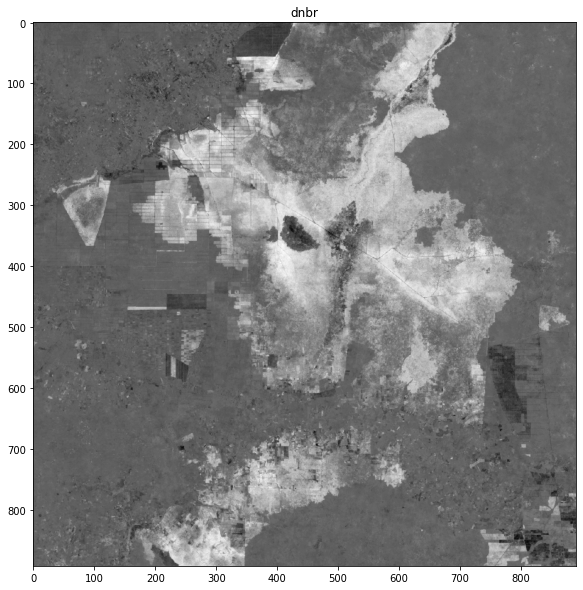

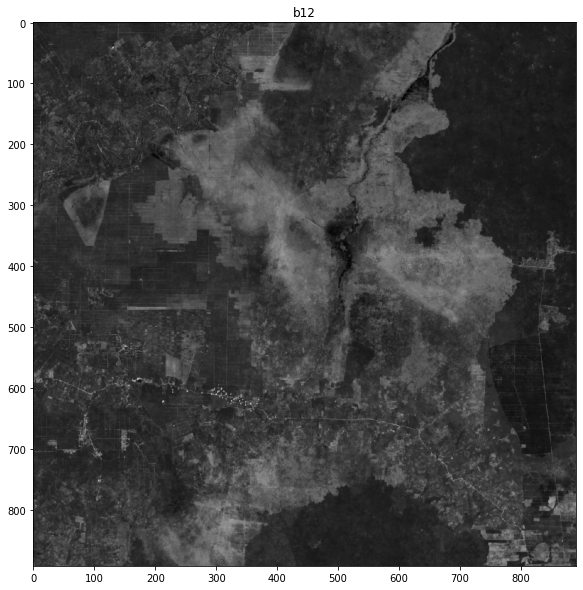

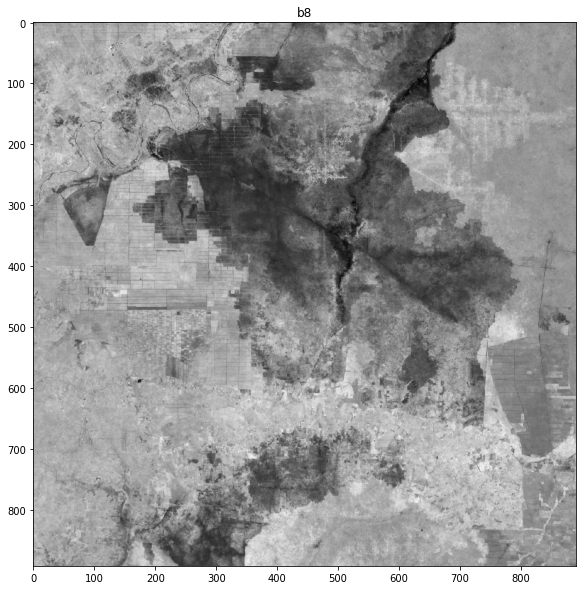

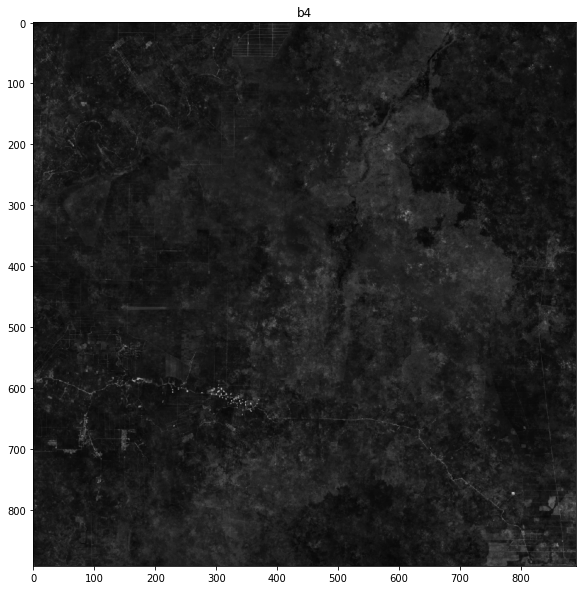

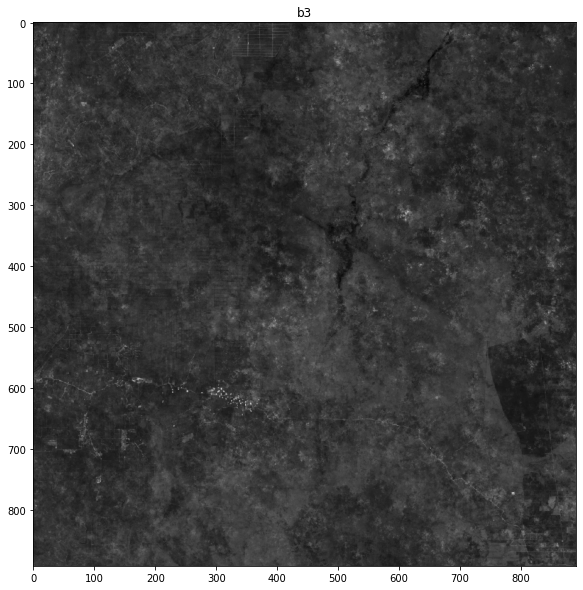

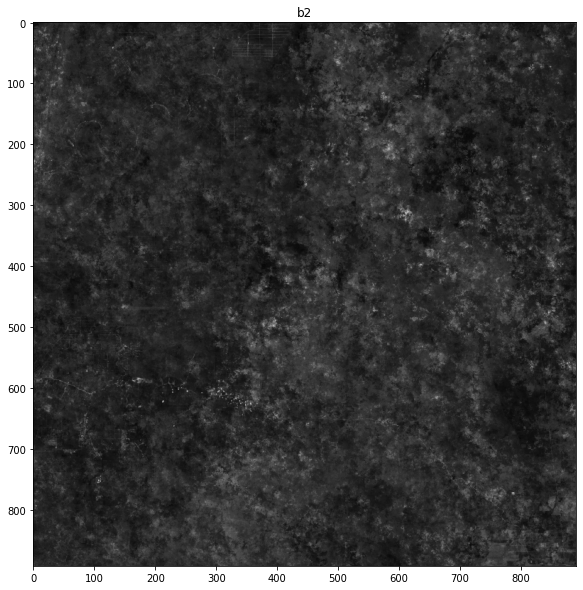

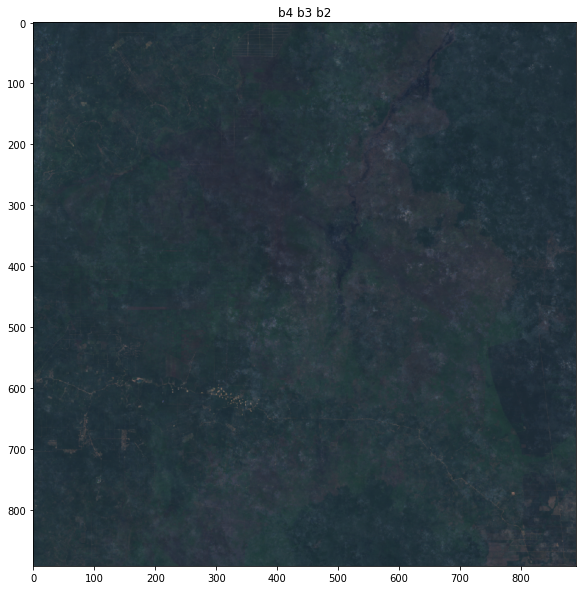

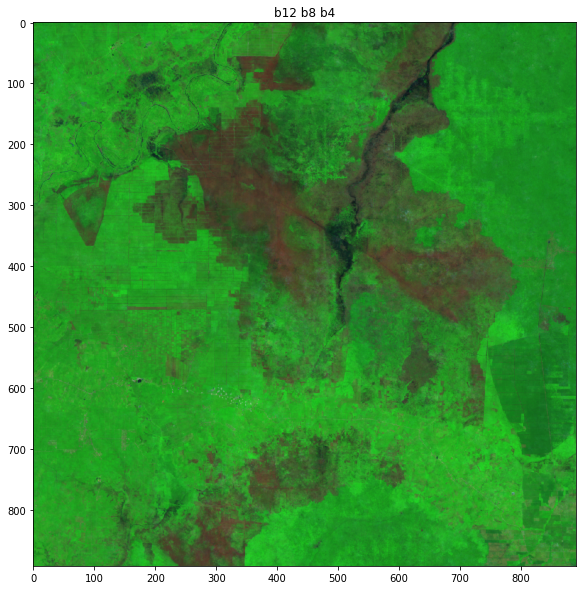

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


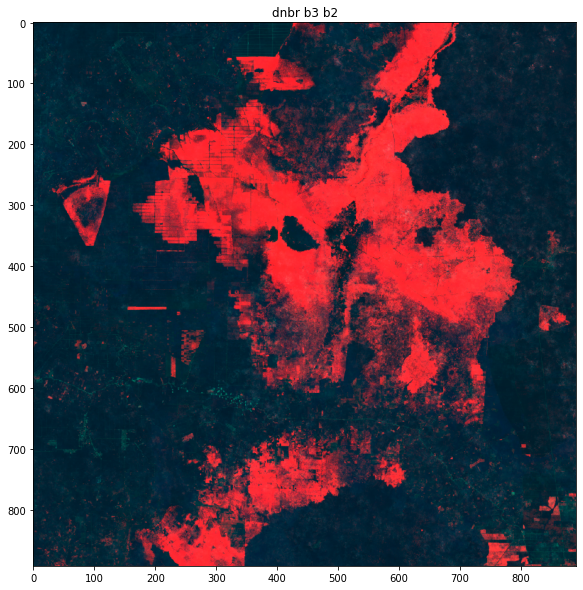

In [8]:
sentinel_metadata = pd.read_csv(METADATA_SENTINEL_2_FILE_PATH)

sentinel_postfire_img_band = get_img_as_array(sentinel_metadata['folder_paths_geotiff'][5000], SENTINEL_POSTFIRE_DICT)

for band, img in sentinel_postfire_img_band.items():
    display_image(img, figsize=(100, 10), title=band, cmap="gray")

b4_b3_b2 = np.dstack(
    (
        sentinel_postfire_img_band['b4'], 
        sentinel_postfire_img_band['b3'], 
        sentinel_postfire_img_band['b2'],
    )
)
b12_b8_b4 = np.dstack(
    (
        sentinel_postfire_img_band['b12'], 
        sentinel_postfire_img_band['b8'], 
        sentinel_postfire_img_band['b4'],
    )
)

dnbr_b3_b2 = np.dstack(
    (
        sentinel_postfire_img_band['dnbr'],
        sentinel_postfire_img_band['b4'],
        sentinel_postfire_img_band['b3'],
    )
)

display_image(b4_b3_b2*FACTOR, figsize=(100, 10), title="b4 b3 b2")
display_image(b12_b8_b4*FACTOR, figsize=(100, 10), title="b12 b8 b4")
display_image(dnbr_b3_b2*FACTOR, figsize=(100, 10), title="dnbr b3 b2")

## Plot Mean dNBR (Delta Normalized Burned Ratio) from Landsat-8 Metadata

Determine class of the image based on mean of Delta Normalized Burned Ration of each image

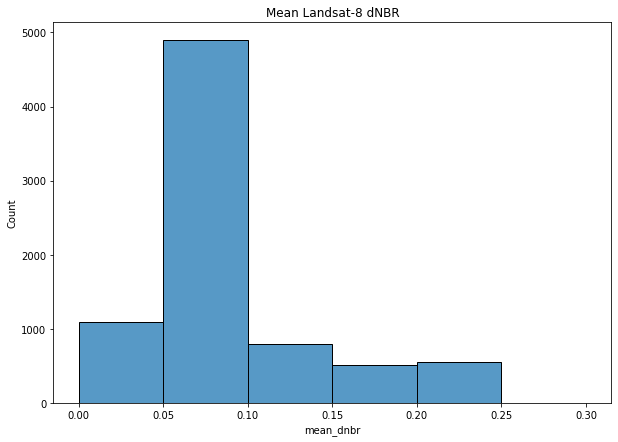

In [36]:
bins = [i for i in np.arange(0,0.35,0.05)]

plt.figure(figsize=(10,7))
plt.title("Mean Landsat-8 dNBR")
sns.histplot(sentinel_metadata['mean_dnbr'], bins=bins)
plt.show()

Based on the histogram plot above, we will determine class as based on this terms:
1. if mean below <= 0.05 class 0
2. if mean below <= 0.1 class 1
3. if mean below 0.1 <  class 2

In [37]:
# if mean below <= 0.05 class 0
# if mean below <= 0.1 class 1
# if mean below 0.1 <  class 2
burn_severity_class = []

for mean_dnbr in sentinel_metadata['mean_dnbr']:
    if mean_dnbr <= 0.05:
        burn_severity_class.append(0)
    elif mean_dnbr <= 0.1:
        burn_severity_class.append(1)
    else:
        burn_severity_class .append(2)

In [38]:
sentinel_metadata['class'] = burn_severity_class
sentinel_metadata.head()

,folder_paths_geotiff,mean_dnbr,median_dnbr,class
0,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.069220,0.044800,1
1,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.068915,0.044502,1
2,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.068327,0.044358,1
3,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.058782,0.028386,1
4,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.069395,0.044928,1


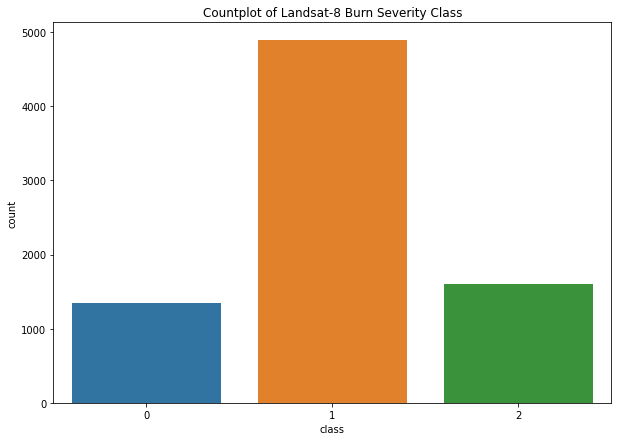

In [39]:
plt.figure(figsize=(10,7))
plt.title("Countplot of Landsat-8 Burn Severity Class")
sns.countplot(x='class', data=landsat_metadata)
plt.show()

## Export to .csv file

In [41]:
sentinel_metadata.to_csv(METADATA_SENTINEL_2_FILE_PATH, index=False)

## Plot Median dNBR (Delta Normalized Burned Ratio) from Sentinel Metadata
Determine class of the image based on median of Delta Normalized Burned Ratio of each image

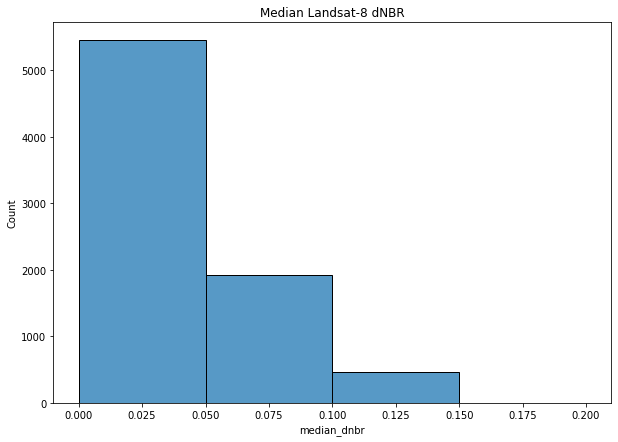

In [42]:
bins = [i for i in np.arange(0,0.25,0.05)]

plt.figure(figsize=(10,7))
plt.title("Median Landsat-8 dNBR")
sns.histplot(landsat_metadata['median_dnbr'], bins=bins)
plt.show()

## Convert to .jpeg file
The steps for this code involve:
1. Looping through all the GeoTIFF file paths from the **sentinel_metadata** (D:\\wildfire-sumatera-dataset\\metadata_landsat_8.csv)
2. Create a new file name with its extension which is *.jpeg*.'
3. Get the GeoTIFFs file from the file path, get the image in form of an array using ***get_img_as_array*** function and then convert to *.jpeg* using ***convert_to_jpeg*** function.
4. If the process is succesful then append image condition as 1 (success) to an array. Otherwise, set it to 0 (fail) so that it wont be used.
5. If the file already exist just append the image condition as 1 (success) to an array.

In [45]:
image_condition = []
ext = ".jpeg"
for folder in sentinel_metadata['folder_paths_geotiff']:
    file_path = SENTINEL_2_JPEG_FOLDER_PATH + "\\" + folder.split('\\')[-1] + ext
    if not os.path.exists(file_path):
        try:
            sentinel_postfire_img_band = get_img_as_array(folder, sentinel_postfire_dict)
            result = convert_to_jpeg(
                bands = [
                    sentinel_postfire_img_band['b2'],
                    sentinel_postfire_img_band['b3'],
                    sentinel_postfire_img_band['dnbr'], 
                ],
                file_path = file_path,
                )
            if result:
                image_condition.append(1)
        except:
            print(sys.exc_info()[0], "occurred.")
            image_condition.append(0)
    else:
        image_condition.append(1)
        print("{} already exist".format(file_path))

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\0.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\3.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\4.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\8.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\9.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\10.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\11.jpeg alre

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\332.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\333.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\334.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\335.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\336.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\337.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\338.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\339.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\340.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\341.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\342.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\se

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\567.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\568.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\569.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\570.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\571.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\572.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\573.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\574.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\575.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\576.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\577.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\se

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\798.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\799.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\800.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\801.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\802.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\803.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\804.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\805.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\806.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\807.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\808.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\se

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1012.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1013.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1014.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1015.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1016.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1017.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1018.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1019.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1020.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1021.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1022.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1216.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1217.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1218.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1219.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1220.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1221.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1222.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1223.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1224.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1225.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1226.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1413.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1414.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1415.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1416.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1417.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1418.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1419.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1420.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1421.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1422.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1423.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1598.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1599.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1600.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1601.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1602.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1603.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1604.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1605.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1606.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1607.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1608.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1774.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1775.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1776.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1777.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1778.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1779.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1780.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1781.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1782.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1783.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1784.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1957.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1958.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1959.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1960.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1961.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1962.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1963.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1964.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1965.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1966.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\1967.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2124.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2125.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2126.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2127.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2128.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2129.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2130.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2131.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2132.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2133.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2134.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2289.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2290.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2291.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2292.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2293.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2294.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2295.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2296.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2297.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2298.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2299.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2450.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2451.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2452.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2453.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2454.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2455.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2456.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2457.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2458.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2459.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2460.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2615.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2616.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2617.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2618.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2619.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2620.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2621.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2622.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2623.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2624.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2625.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2777.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2778.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2779.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2780.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2781.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2782.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2783.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2784.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2785.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2786.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2787.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2929.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2930.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2931.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2932.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2933.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2934.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2935.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2936.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2937.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2938.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\2939.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\3904.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\3905.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\3906.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\3907.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\3908.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\3909.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\3910.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\3911.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\3912.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\3913.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\3914.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\4667.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\4668.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\4669.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\4670.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\4671.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\4672.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\4673.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\4674.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\4675.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\4676.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\4677.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5220.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5221.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5222.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5223.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5224.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5225.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5226.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5227.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5228.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5229.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5230.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5678.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5679.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5680.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5681.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5682.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5683.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5684.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5685.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5686.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5687.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\5688.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6082.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6083.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6084.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6085.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6086.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6087.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6088.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6089.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6090.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6091.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6092.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6442.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6443.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6444.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6445.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6446.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6447.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6448.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6449.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6450.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6451.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6452.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6758.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6759.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6760.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6761.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6762.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6763.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6764.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6765.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6766.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6767.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\6768.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7062.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7063.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7064.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7065.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7066.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7067.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7068.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7069.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7070.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7071.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7072.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7332.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7333.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7334.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7335.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7336.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7337.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7338.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7339.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7340.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7341.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7342.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7605.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7606.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7607.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7608.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7609.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7610.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7611.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7612.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7613.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7614.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2\7615.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumat